In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os
from pyunicorn.timeseries import RecurrencePlot
import iberoSignalPro.preprocesa as ib
import ntwktools as nt

import logging
logging.basicConfig(level=logging.CRITICAL)

In [2]:
def rp_adquisition(file_path, bands = "mu",  channels = ["Cz", "C1", "C2"], norm = False, max_min = [0, 1], vecindad = 0, tau = 1, dim = 1, metric = "manhattan"):
    '''
    bands: mu, beta, gamma
    metric: manhattan, epsilon, supremum
    '''
    df = pd.read_csv(file_path)
    act, rep = nt.obtener_win(df.EnvAnta, df.Binaria, siPlot = False)
    act, rep = nt.selecciona_ventanas(act, rep, siPlot = True, signal = df.EnvAnta, win_len=15)
    
    band_signals = df[[f"{bands}_" + channel for channel in channels]]
    print(band_signals.min().min(), band_signals.max().max())
    if norm:
        band_signals = ib.normaliza(band_signals, min_val= max_min[0], max_val= max_min[1]).T
        #band_signals = ib.normaliza(band_signals, options="morum").T
    activity_rps = []
    rest_rps = []
    for act_start, act_end in act:
        activity_signals = np.array(band_signals[act_start:act_end])
        if vecindad == 0:
            vecindad = activity_signals.std() * 1.2
        try:
            activity_rp = RecurrencePlot(activity_signals, threshold=vecindad, tau=tau, epsilon='distance', metric=metric)
            activity_rps.append(activity_rp)
        except Exception as e:
            print(f"error: {e}")

    for rep_start, rep_end in rep:
        rest_signals = np.array(band_signals[rep_start:rep_end])
        if vecindad == 0:
            vecindad = rest_signals.std() * 1.2
        try:
            rest_rp = RecurrencePlot(rest_signals, threshold=vecindad, tau=tau, epsilon='distance', metric=metric)
            rest_rps.append(rest_rp)
        except Exception as e:
            print(f"error: {e}")
    return activity_rps, rest_rps


In [16]:
FILE_NAME = r"C:\Users\fercy\OneDrive\Escritorio\InternadoFMM\Pruebas%20BCI\SeñalesProcesadas10Hz2\MauricioServin\S2\5deTorquePre.csv"

#INPUT

selected_channels = [["C2", "C1", "FCz", "Cz", "Pz"],
                     ["Cz", "Oz", "C3", "FCz", "P3"],
                     ["C3", "FC4", "CP3", "P4"]]

#INPUT

#selected_channels = [["C3", "CP3", "C1", "Pz", "Oz", "C4", "CP4"],
#                       ["Oz", "C3", "P3", "FC4"],
#                      ["CP3", "P3", "C3", "C4", "C2", "P4"]]

#OUTPUT
#selected_channels = [["Cz", "C1", "C2", "P3"],
#                    ["FCz", "Oz", "P3", "CP4"],
#                    ["C1", "C2", "P4", "O2"]]

#BETE
#selected_channels = [["FC4", "Pz", "FCz", "C2"],
#                    ["Cz", "O2"],
#                    ["C2", "FC4", "CP3"]]

band = "mu"

if band == "mu":
    selected_channels = selected_channels[0]
elif band == "beta":
    selected_channels = selected_channels[1]
else:
    selected_channels = selected_channels[2]



In [17]:

data = pd.read_csv(FILE_NAME)
selected_columns = [f"{band}_" + ch for ch in selected_channels] + ["Binaria"]
data = data[selected_columns]
system_net = nt.Network(data, bin=data["Binaria"], fs=10, ch_names=selected_channels)
act, rep = system_net.get_ntwks(data.drop(columns=["Binaria"]), bin=data["Binaria"]);

(2632,)
****************************
194 344
(150, 5)
****************************


c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should

****************************
869 1019
(150, 5)
****************************
****************************
1514 1664
(150, 5)
****************************


c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should

****************************
2159 2309
(150, 5)
****************************
****************************
509 659
(150, 5)
****************************


c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should

****************************
1214 1364
(150, 5)
****************************


c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should

****************************
1829 1979
(150, 5)
****************************


c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results

c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\statsmodels\tsa\stattools.py:1545: FutureWarning:

verbose is deprecated since functions should not print results



In [18]:
len(act), len(rep)

(4, 3)

<Axes: >

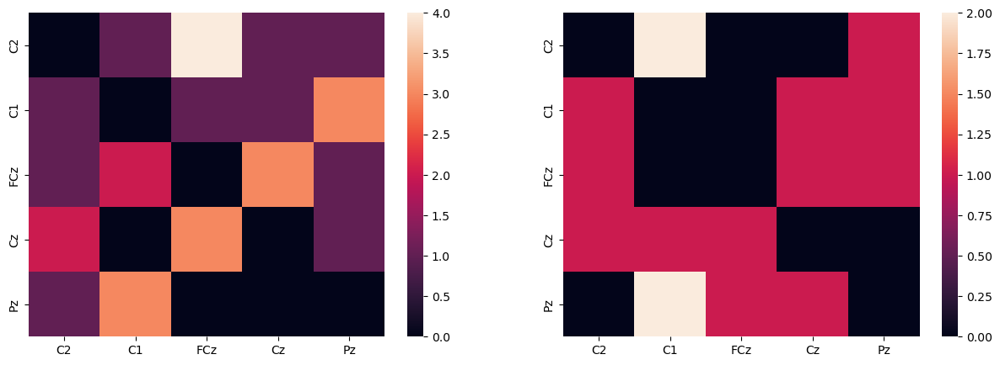

In [19]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.heatmap(system_net.array_mat_act.sum(axis = 0), yticklabels=selected_channels, xticklabels=selected_channels)
plt.subplot(1, 2, 2)
sns.heatmap(system_net.array_mat_rep.sum(axis = 0), yticklabels=selected_channels, xticklabels=selected_channels)

In [20]:
import networkx as nx

def plot_custom_connectivity(matriz_actividad, selected_ch_names, selected_x, selected_y):
    """
    Plots a connectivity graph based on a given connectivity matrix and EEG channel positions.
    """
    G = nx.Graph()

    # Agregar nodos
    for i, name in enumerate(selected_ch_names):
        G.add_node(i, pos=(selected_x[i], selected_y[i]), label=name)

    # Agregar conexiones basadas en la matriz de conectividad
    for i in range(matriz_actividad.shape[0]):
        for j in range(matriz_actividad.shape[1]):
            if matriz_actividad[i, j]:  
                G.add_edge(i, j, weight=matriz_actividad[i, j])  

    pos = nx.get_node_attributes(G, 'pos')

    
  
    node_size = [20 * G.degree(n) for n in G.nodes()]

    # Grosor de las conexiones basado en la intensidad de conectividad
    edge_width = [G[u][v]['weight'] * 2 for u, v in G.edges()]

    # Graficar la red de conectividad
    plt.figure(figsize=(5, 5))
    nx.draw(G, pos, labels=nx.get_node_attributes(G, 'label'),
            node_color="gray", node_size=node_size, font_size=10,
            font_weight='bold', edge_color="coral", width=edge_width, arrowsize=30)

    plt.title("EEG Connectivity Graph")
    plt.show()

In [21]:
selected_channels

['C2', 'C1', 'FCz', 'Cz', 'Pz']

(2632,)


,mu_C2,mu_C1,mu_FCz,mu_Cz,mu_Pz
0,0.091378,0.096978,0.085498,0.083318,0.133627
1,0.083656,0.073906,0.079631,0.092020,0.078906
2,0.062423,0.053014,0.077459,0.095446,0.061815
3,0.055799,0.050062,0.069534,0.088228,0.083112
4,0.062658,0.066724,0.069006,0.082556,0.127157
...,...,...,...,...,...
2627,0.052515,0.021328,0.043436,0.099797,0.079586
2628,0.046889,0.021639,0.024679,0.075897,0.109293
2629,0.044811,0.024092,0.025576,0.057905,0.121890
2630,0.042146,0.024002,0.051466,0.060997,0.079526


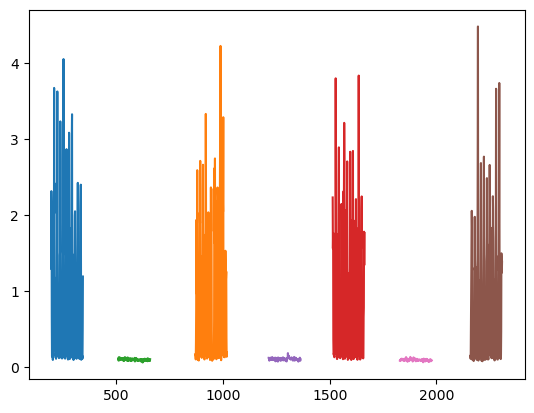

In [22]:
df = pd.read_csv(FILE_NAME)
act, rep = nt.obtener_win(df.EnvAnta, df.Binaria, siPlot = False)
act, rep = nt.selecciona_ventanas(act, rep, siPlot = True, signal = df.EnvAnta, win_len=15)
    
band_signals = df[[f"{band}_" + channel for channel in selected_channels]]
band_signals

In [23]:
band_signals

,mu_C2,mu_C1,mu_FCz,mu_Cz,mu_Pz
0,0.091378,0.096978,0.085498,0.083318,0.133627
1,0.083656,0.073906,0.079631,0.092020,0.078906
2,0.062423,0.053014,0.077459,0.095446,0.061815
3,0.055799,0.050062,0.069534,0.088228,0.083112
4,0.062658,0.066724,0.069006,0.082556,0.127157
...,...,...,...,...,...
2627,0.052515,0.021328,0.043436,0.099797,0.079586
2628,0.046889,0.021639,0.024679,0.075897,0.109293
2629,0.044811,0.024092,0.025576,0.057905,0.121890
2630,0.042146,0.024002,0.051466,0.060997,0.079526


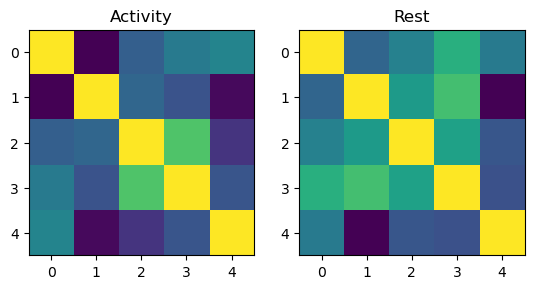

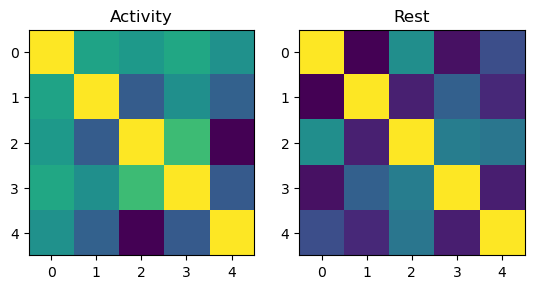

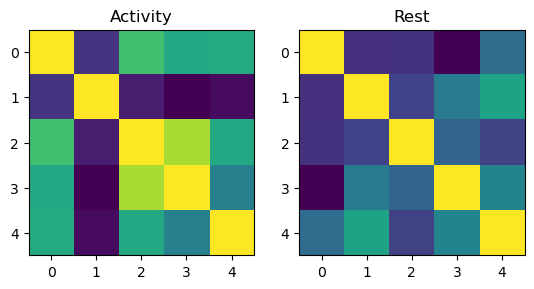

In [24]:
for i in range(min([len(act), len(rep)])):
    plt.figure()
    plt.subplot(1, 2, 1)

    plt.imshow(band_signals.iloc[act[i][0]:act[i][1]].corr())
    plt.title("Activity")
    plt.subplot(1, 2, 2)
    plt.imshow(band_signals.iloc[rep[i][0]:rep[i][1]].corr())
    plt.title("Rest")
    plt.show()

In [25]:
import plotly.graph_objects as go

x_A = np.array([0])
y_A = np.array([0])

y_A = np.arange(0, len(y_A), 1)

z_A = np.array([0])
w_A = np.array([0])
k_A = np.array([0])


x_R = np.array([0])
y_R = np.array([0])

y_R = np.arange(0, len(y_A), 1)

z_R = np.array([0])
w_R = np.array([0])
k_R = np.array([0])


for i in range(min([len(act), len(rep)])):
    x_A = np.concatenate([x_A,  band_signals.iloc[act[i][0]:act[i][1]].mu_Cz])
    #y_A = np.concatenate([y_A,  band_signals.iloc[act[i][0]:act[i][1]].mu_C1])
    y_A = np.arange(0, len(x_A), 1)

    z_A = np.concatenate([z_A,  band_signals.iloc[act[i][0]:act[i][1]].mu_C2])
    w_A = np.concatenate([w_A,  band_signals.iloc[act[i][0]:act[i][1]].mu_FCz])
    k_A = np.concatenate([k_A,  band_signals.iloc[act[i][0]:act[i][1]].mu_Pz])
    
    

for i in range(min([len(act), len(rep)])):
    x_R = np.concatenate([x_R,  band_signals.iloc[rep[i][0]:rep[i][1]].mu_Cz])
    #y_R = np.concatenate([y_R,  band_signals.iloc[rep[i][0]:rep[i][1]].mu_C1])
    y_R = np.arange(0, len(x_R), 1)

    z_R = np.concatenate([z_R,  band_signals.iloc[rep[i][0]:rep[i][1]].mu_C2])
    w_R = np.concatenate([w_R,  band_signals.iloc[rep[i][0]:rep[i][1]].mu_FCz])
    k_R = np.concatenate([k_R,  band_signals.iloc[rep[i][0]:rep[i][1]].mu_Pz])
    



fig = go.Figure()


fig.add_trace(go.Scatter3d(
    x=x_A,
    y=y_A,
    z=z_A,
    mode='lines+markers',
    name='Actividad',
    marker=dict(
        size=4,
        color='blue',
        opacity=0.8
    ),
    line=dict(
        color='blue',
        width=2
    )
))

# Add the second line with comet effect
fig.add_trace(go.Scatter3d(
    x=x_R,
    y=y_R,
    z=z_R,
    mode='lines+markers',
    name='Reposo',
    marker=dict(
        size=4,
        color='red',
        opacity=0.8
    ),
    line=dict(
        color='red',
        width=2
    )
))

# Create frames for animation
frames = [go.Frame(data=[
    go.Scatter3d(
        x=x_A[:k+1],
        y=y_A[:k+1],
        z=z_A[:k+1],
        mode='lines+markers',
        marker=dict(
            size=4,
            color='blue',
            opacity=0.8
        ),
        line=dict(
            color='blue',
            width=2
        )
    ),
    go.Scatter3d(
        x=x_R[:k+1],
        y=y_R[:k+1],
        z=z_R[:k+1],
        mode='lines+markers',
        marker=dict(
            size=4,
            color='red',
            opacity=0.8
        ),
        line=dict(
            color='red',
            width=2
        )
    )
]) for k in range(len(x_A))]

# Add frames to the figure
fig.frames = frames

# Update layout with animation settings
fig.update_layout(
    title='Comet Plot of Rössler System',
    scene=dict(
        xaxis_title='mu FCz',
        yaxis_title='mu Pz',
        zaxis_title='Tiempo'
    ),
    updatemenus=[dict(
        type='buttons',
        showactive=False,
        buttons=[dict(label='Play',
                      method='animate',
                      args=[None, dict(frame=dict(duration=10, redraw=True), fromcurrent=True)])]
    )]
)

# Show the plot
fig.show()

Calculating recurrence plot at fixed threshold...
Calculating the euclidean distance matrix...
Calculating recurrence plot at fixed threshold...
Calculating the euclidean distance matrix...


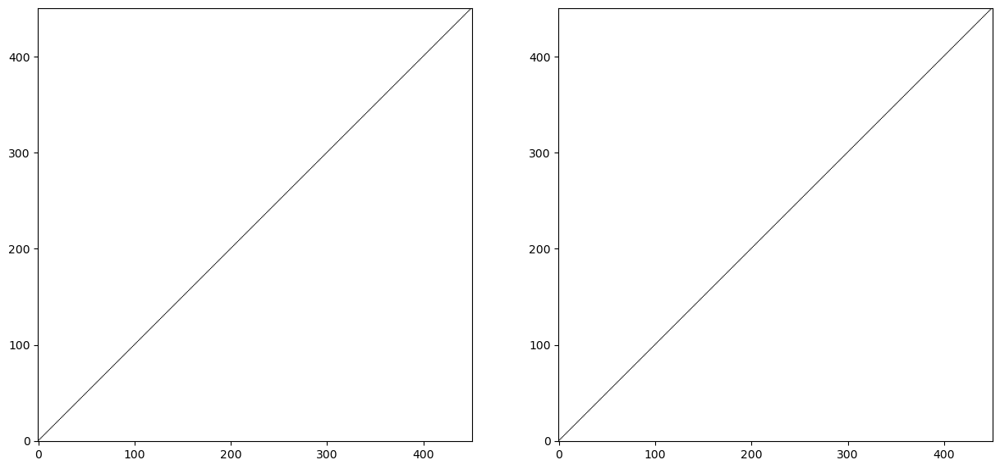

In [26]:
plt.figure(figsize=(15, 15))

plt.subplot(1, 2, 1)

activity_rp = RecurrencePlot(np.array([x_A, y_A, z_A, w_A, k_A]).T, threshold=0.06, tau=3, epsilon='distance', metric="euclidean")
plt.imshow(activity_rp.recurrence_matrix(), cmap='binary', origin='lower')

plt.subplot(1, 2, 2)

activity_rp = RecurrencePlot(np.array([x_R, y_R, z_R, w_R, k_R]).T, threshold=0.06, tau=3, epsilon='distance', metric="euclidean")
plt.imshow(activity_rp.recurrence_matrix(), cmap='binary', origin='lower')



c:\Users\fercy\miniconda3\envs\ibero\Lib\site-packages\networkx\drawing\nx_pylab.py:312: UserWarning:



The arrowsize keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default values.
Note that using FancyArrowPatches may be slow for large graphs.




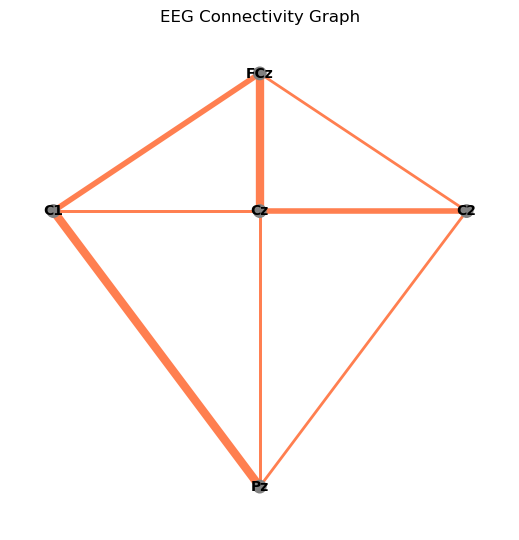

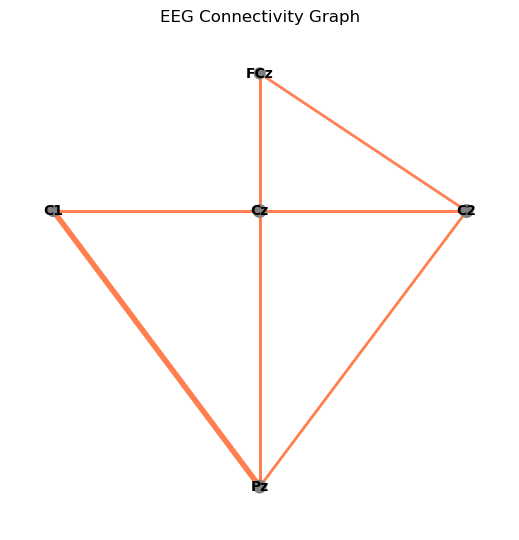

In [27]:
y, x, ro, deg, ch_names = ib.eloc_reader(r"E:\Research\InternadoFMM\Codigo\eloc16_bueno.txt")

#selected_indices = [i for i, ch in enumerate(ch_names) if ch in selected_channels]

selected_indices = [np.where(ch_names == selected_channels[i])[0] for i, ch in enumerate(selected_channels) if ch in ch_names]
selected_indices = np.array(selected_indices).flatten()
selected_x = x[selected_indices]
selected_y = y[selected_indices]

plot_custom_connectivity(system_net.array_mat_act.sum(axis = 0), selected_channels, selected_x, selected_y)
plot_custom_connectivity(system_net.array_mat_rep.sum(axis = 0), selected_channels, selected_x, selected_y)

#x = np.concatenate((new_x, selected_x))

#y = np.concatenate((new_y, selected_y))

In [28]:
selected_channels

['C2', 'C1', 'FCz', 'Cz', 'Pz']

(2632,)
0.003220629788734 0.6781633655730535
Calculating recurrence plot at fixed threshold...
Calculating the supremum distance matrix...
Calculating recurrence plot at fixed threshold...
Calculating the supremum distance matrix...
Calculating recurrence plot at fixed threshold...
Calculating the supremum distance matrix...
Calculating recurrence plot at fixed threshold...
Calculating the supremum distance matrix...
Calculating recurrence plot at fixed threshold...
Calculating the supremum distance matrix...
Calculating recurrence plot at fixed threshold...
Calculating the supremum distance matrix...
Calculating recurrence plot at fixed threshold...
Calculating the supremum distance matrix...


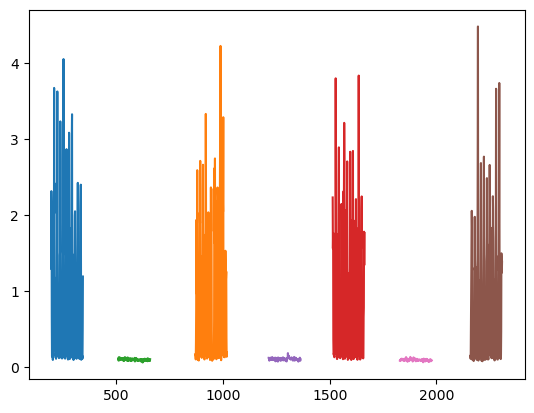

In [29]:
# Quiza beta
# activity_rps, rest_rps = rp_adquisition(FILE_NAME, bands = band,  channels=selected_channels, norm = True, max_min = [0.001, 0.8], vecindad = 0.07, tau = 3, metric="supremum")
# Quiza mu
activity_rps, rest_rps = rp_adquisition(FILE_NAME, bands = band,  channels=selected_channels, norm = True, max_min = [0.001, 0.8], vecindad = 0.05, tau = 3, metric="supremum")
# Quiza gamma
#activity_rps, rest_rps = rp_adquisition(FILE_NAME, bands = band,  channels=selected_channels, norm = True, max_min = [0.001, 0.8], vecindad = 0.07, tau = 3, metric="supremum")


In [30]:
len(activity_rps), len(rest_rps)

(4, 3)

In [87]:
for i in range(min([len(activity_rps), len(rest_rps)])):
    plt.figure(figsize= (8, 8))
    plt.subplot(1, 2, 1)

    plt.imshow(activity_rps[i].recurrence_matrix(), cmap='binary', origin='lower')
    plt.title("Activity")
    plt.subplot(1, 2, 2)
    plt.imshow(rest_rps[i].recurrence_matrix(), cmap='binary', origin='lower')
    plt.title("Rest")
    plt.show()

In [81]:
dict_act = {
    "recurrence_rate": [],
    "determinism": [],
    "laminarity": [],
    "trapping_time": [],
}

dict_rep = {
    "recurrence_rate": [],
    "determinism": [],
    "laminarity": [],
    "trapping_time": [],
}

for i in range(len(activity_rps)):
    dict_act["recurrence_rate"].append(activity_rps[i].recurrence_rate())
    dict_act["determinism"].append(activity_rps[i].determinism())
    dict_act["laminarity"].append(activity_rps[i].laminarity())
    dict_act["trapping_time"].append(activity_rps[i].trapping_time())

for i in range(len(rest_rps)):
    dict_rep["recurrence_rate"].append(rest_rps[i].recurrence_rate())
    dict_rep["determinism"].append(rest_rps[i].determinism())
    dict_rep["laminarity"].append(rest_rps[i].laminarity())
    dict_rep["trapping_time"].append(rest_rps[i].trapping_time())


In [82]:
dict_act

{'recurrence_rate': [np.float64(0.2240888888888889),
  np.float64(0.10915555555555556),
  np.float64(0.2536),
  np.float64(0.3413333333333333),
  np.float64(0.10053333333333334)],
 'determinism': [np.float64(0.8086672117726724),
  np.float64(0.7224631396325999),
  np.float64(0.8563714902792362),
  np.float64(0.9009296148726416),
  np.float64(0.6723484848453014)],
 'laminarity': [np.float64(0.9067830226082769),
  np.float64(0.836726384361414),
  np.float64(0.9288468278988279),
  np.float64(0.9548177083320901),
  np.float64(0.8267020335949307)],
 'trapping_time': [np.float64(4.042440318266645),
  np.float64(3.5008517886967487),
  np.float64(4.58477508646553),
  np.float64(5.019164955475571),
  np.float64(3.1011608623034634)]}

In [83]:
dict_rep

{'recurrence_rate': [np.float64(0.11724444444444444),
  np.float64(0.06471111111111111),
  np.float64(0.04888888888888889),
  np.float64(0.09893333333333333)],
 'determinism': [np.float64(0.6760450160744532),
  np.float64(0.6983154670696914),
  np.float64(0.566315789467723),
  np.float64(0.7986512524046309)],
 'laminarity': [np.float64(0.832827899921028),
  np.float64(0.8358516483459076),
  np.float64(0.7518181818113472),
  np.float64(0.8921832884056955)],
 'trapping_time': [np.float64(3.5840130505124956),
  np.float64(3.41853932574667),
  np.float64(3.0516605164925585),
  np.float64(4.462921348214317)]}